### Laboratorium 6 - część projektowa

W tej części zajmiesz się wykorzystaniem punktów kluczowych do łączenia obrazów (_image stitching_). Celem zadania jest przetestowanie możliwości detekcji i parowania punktów kluczowych w celu łączenia obrazów. Istotne jest, by samodzielnie przejść całą ścieżkę: od detekcji punktów kluczowych i wyznaczenia ich desktryptorów, przez ich parowanie i znalezienie transformacji, po finalne połączenie obrazów. Rozwiązania oparte o gotowce w stylu black-box nie będą oceniane.

Wykonaj serię zdjęć dowolnej wybranej przez siebie **statycznej** sceny. Może to być niemal dowolny widok o dowolnej skali: panorama miasta, swojego pokoju, powierzchni biurka - ważne, by pozyskane obrazy umożliwiały (1) użycie algorytmu SIFT, oraz (2) wykonanie transformacji geometrycznej.

Wykonaj 4-5 zdjęć, spośród których pierwsze (nazwij je `base`) niech przedstawia \"główny\" widok sceny, a pozostałe (o nazwie `offset_{index}`) niech cechują się coraz większym przesunięciem kamery względem `base`. Proponowane różnice:
* nieznaczne przesunięcie (o ~połowę szerokości klatki),
* większe przesunięcie (o 3/4 szerokości lub więcej),
* przesunięcie z rotacją w osi kamery,
* (jeśli to możliwe) przybliżenie/oddalenie kamery.

Wykorzystaj algorytmy opracowane do realizacji zadania 3 (zwłaszcza 3b) w celu przekształcania obrazów `offset_x` do geometrii `base`. Upewnij się, że wymiary wynikowych obrazów są wystarczające do zmieszczenia obu składowych.

*Czy każdą parę `offset_i`-`base` udało się połączyć? Jeśli dla którejś pary metoda zawiodła, to dlaczego?*  
*Jaka była jakość dopasowania? Na jakiej podstawie ją określasz?*

In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
def process_images(image1, image2, contrast, edge, use_ransac=False):
    import cv2
    import numpy as np
    import matplotlib.pyplot as plt

    # SIFT Detector
    sift = cv2.SIFT_create(contrastThreshold=contrast, edgeThreshold=edge)
    kp1, des1 = sift.detectAndCompute(image1, None)
    kp2, des2 = sift.detectAndCompute(image2, None)

    # Keypoint Visualization
    image1_kp = cv2.drawKeypoints(
        image1, kp1, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )
    image2_kp = cv2.drawKeypoints(
        image2, kp2, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS
    )
    f, (a1, a2) = plt.subplots(1, 2, figsize=(12, 6))
    f.suptitle(f"Keypoints. contrastT: {contrast}, edgeT: {edge}")
    a1.imshow(image1_kp[..., ::-1])
    a1.set_title(f"Image1 - Keypoints: {len(kp1)}")
    a2.imshow(image2_kp[..., ::-1])
    a2.set_title(f"Image2 - Keypoints: {len(kp2)}")
    plt.show()

    # Matcher
    matcher = cv2.BFMatcher()
    matches = matcher.match(des1, des2)

    # Sort matches by distance
    matches = sorted(matches, key=lambda x: x.distance)

    # Visualize Matches
    show_matches = cv2.drawMatches(
        image1,
        kp1,
        image2,
        kp2,
        matches,
        None,
        singlePointColor=(0, 0, 255),
    )
    plt.figure(figsize=(12, 6))
    plt.imshow(show_matches[..., ::-1])
    plt.title(f"Total Matches: {len(matches)}")
    plt.show()

    # Extract matched keypoints
    src_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)

    # Find Homography
    if use_ransac:
        M, mask = cv2.findHomography(dst_pts, src_pts, cv2.RANSAC, 5.0)
    else:
        M, mask = cv2.findHomography(dst_pts, src_pts, 0)

    # Create larger canvas (overlay)
    overlay_height = int(image1.shape[0] * 2)
    overlay_width = int(image1.shape[1] * 2)
    overlay = np.zeros((overlay_height, overlay_width, 3), dtype=np.uint8)

    # Center image1 in the overlay
    center_y = overlay_height // 2 - image1.shape[0] // 2
    center_x = overlay_width // 2 - image1.shape[1] // 2
    overlay[
        center_y : center_y + image1.shape[0], center_x : center_x + image1.shape[1]
    ] = image1

    # Offset homography for larger canvas
    offset_M = np.array(
        [[1, 0, center_x], [0, 1, center_y], [0, 0, 1]], dtype=np.float32
    )
    M_with_offset = offset_M @ M

    # Warp image2 into the overlay space
    warped_image2 = cv2.warpPerspective(
        image2, M_with_offset, (overlay_width, overlay_height)
    )

    # Blend the images
    alpha = 0.5
    blended_overlay = cv2.addWeighted(overlay, alpha, warped_image2, 1 - alpha, 0)

    # Show the result
    plt.figure(figsize=(12, 12))
    plt.imshow(blended_overlay[..., ::-1])
    plt.title(f"Result with RANSAC: {use_ransac}")
    plt.show()

V1

In [70]:
from PIL import Image

# Load HEIC file and convert to JPEG

# Load the converted image using OpenCV
base = cv2.imread("./assets/v1/base.jpeg")
offset_0 = cv2.imread("./assets/v1/offset_0.jpeg")
offset_1 = cv2.imread("./assets/v1/offset_1.jpeg")
offset_2 = cv2.imread("./assets/v1/offset_2.jpeg")
offset_3 = cv2.imread("./assets/v1/offset_3.jpeg")
offset_4 = cv2.imread('./assets/v1/offset_4.jpeg')

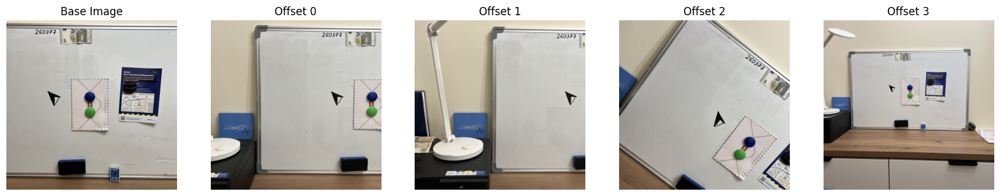

In [71]:
fig, axes = plt.subplots(1, 5, figsize=(20, 10))

axes[0].imshow(cv2.cvtColor(base, cv2.COLOR_BGR2RGB))
axes[0].set_title("Base Image")
axes[0].axis("off")

axes[1].imshow(cv2.cvtColor(offset_0, cv2.COLOR_BGR2RGB))
axes[1].set_title("Offset 0")
axes[1].axis("off")

axes[2].imshow(cv2.cvtColor(offset_1, cv2.COLOR_BGR2RGB))
axes[2].set_title("Offset 1")
axes[2].axis("off")

axes[3].imshow(cv2.cvtColor(offset_2, cv2.COLOR_BGR2RGB))
axes[3].set_title("Offset 2")
axes[3].axis("off")

axes[4].imshow(cv2.cvtColor(offset_3, cv2.COLOR_BGR2RGB))
axes[4].set_title("Offset 3")
axes[4].axis("off")

plt.show()

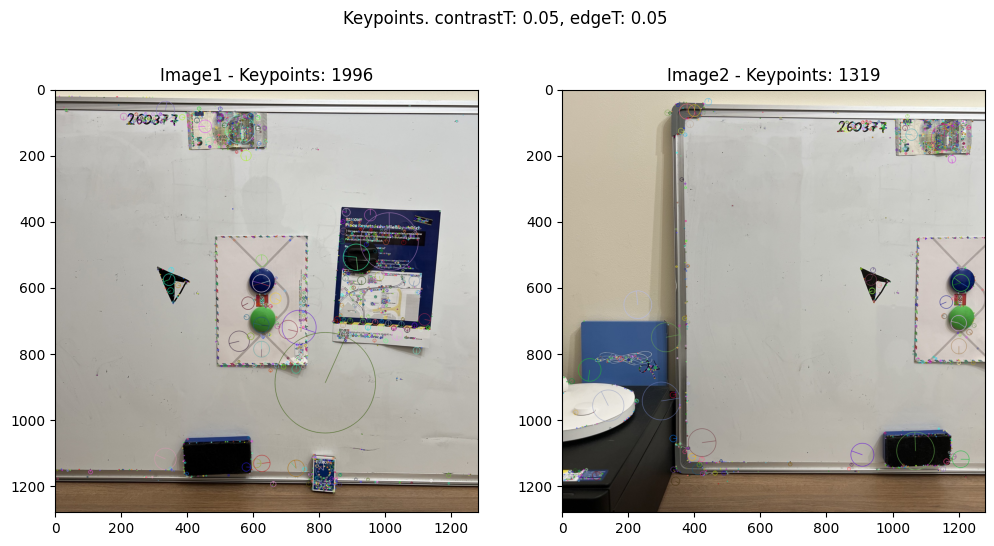

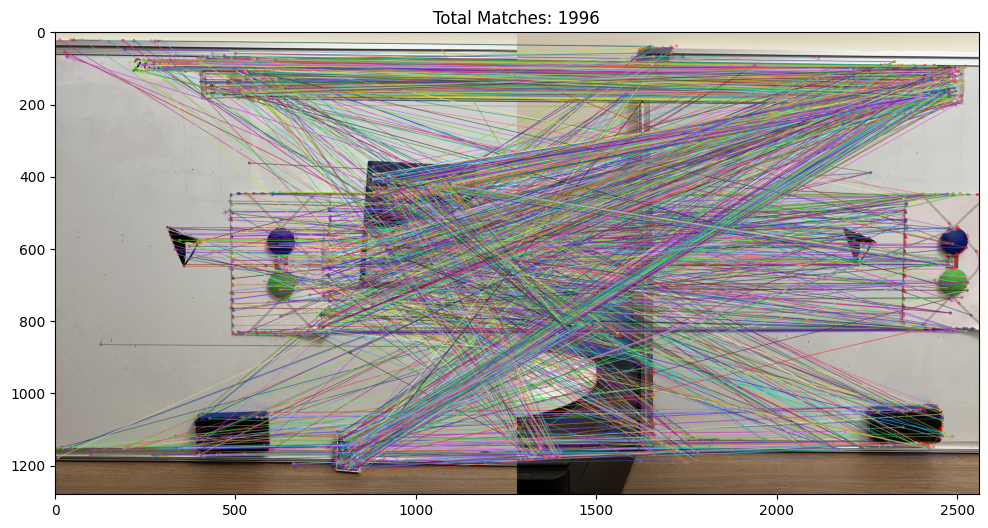

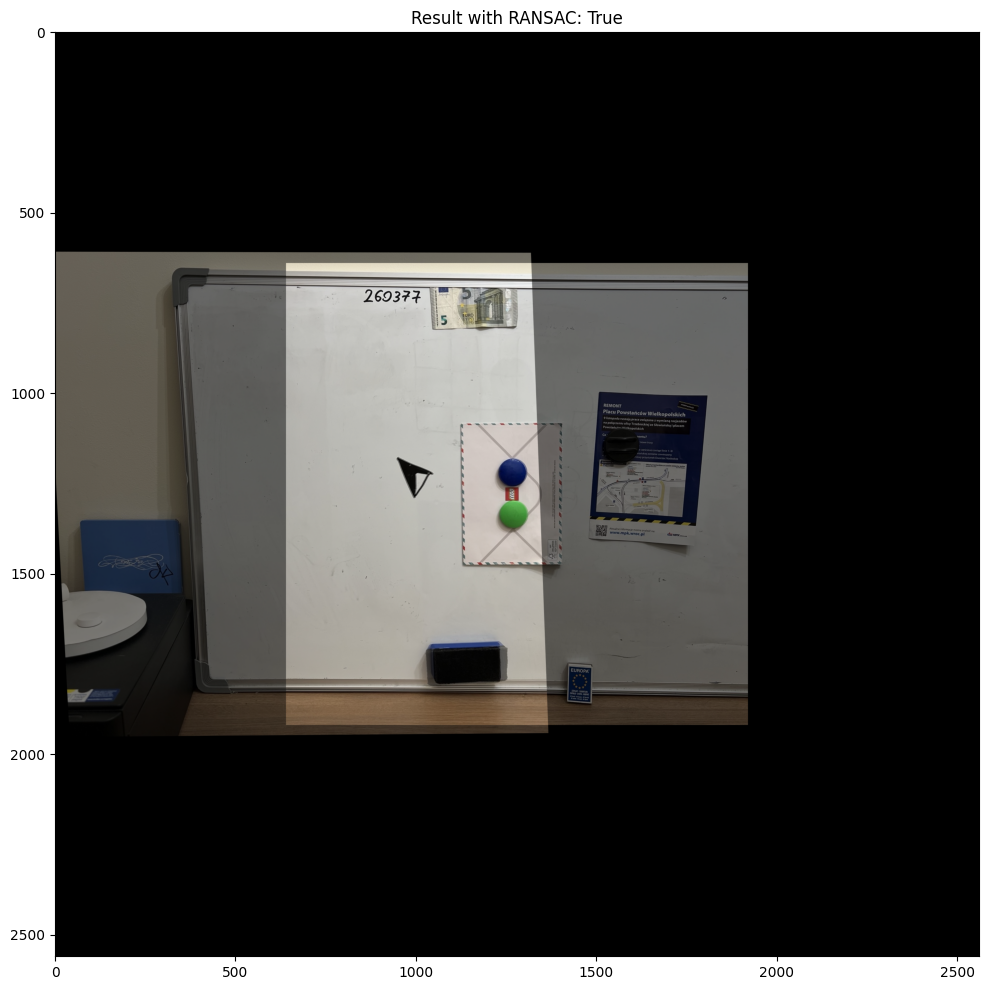

In [72]:
process_images(base, offset_0, 0.05, 0.05, use_ransac=True)

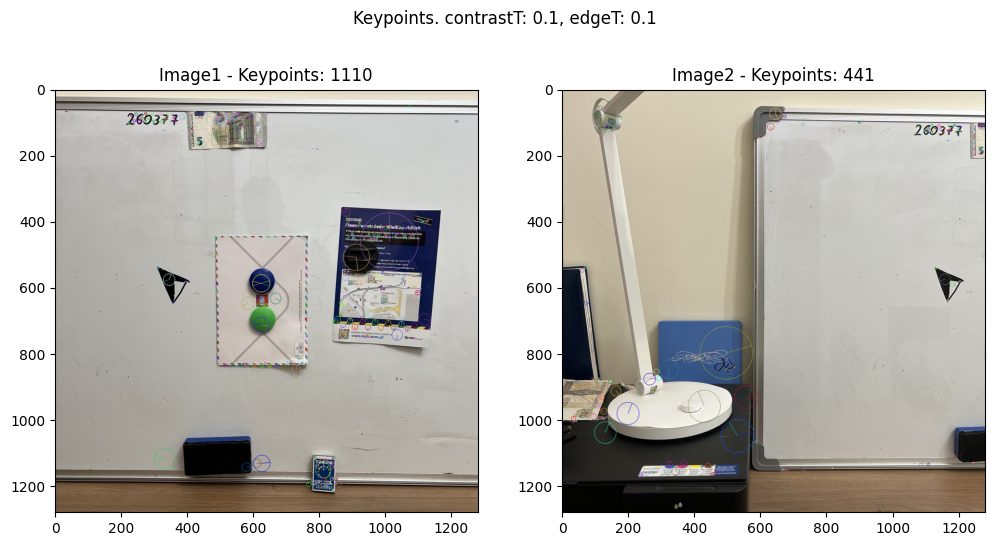

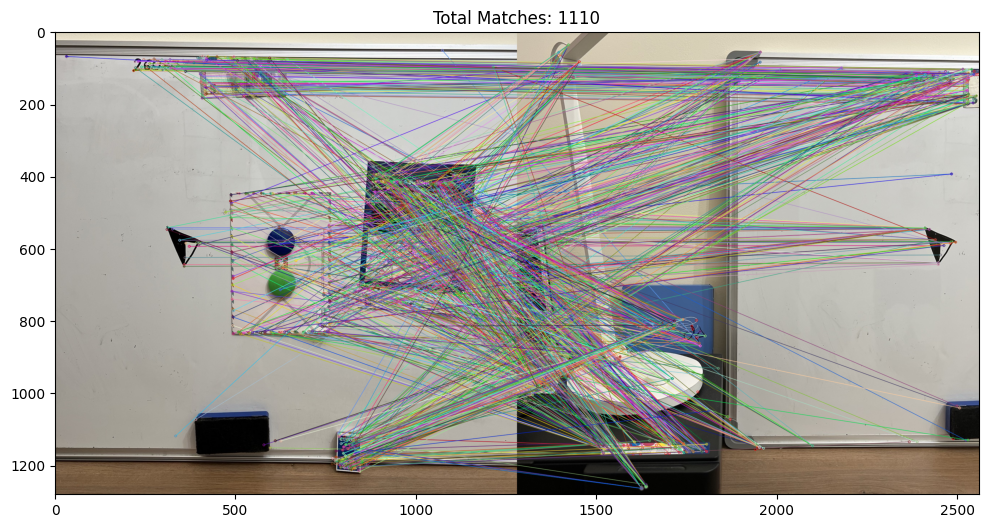

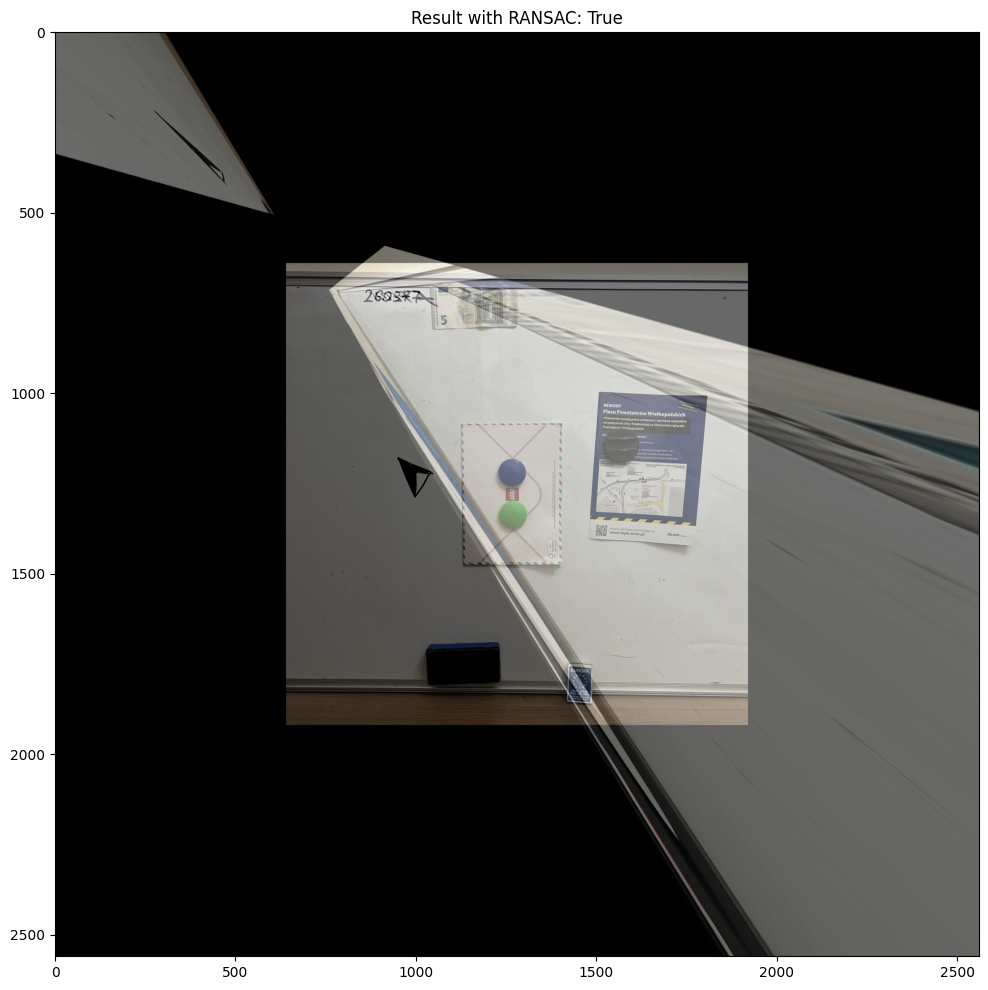

In [75]:
process_images(base, offset_1, 0.1, 0.1, use_ransac=True)

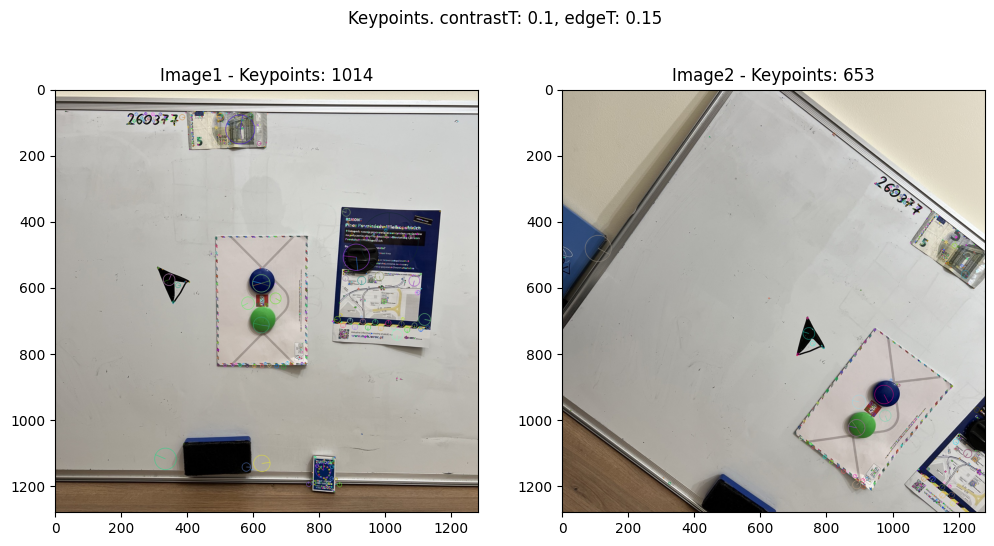

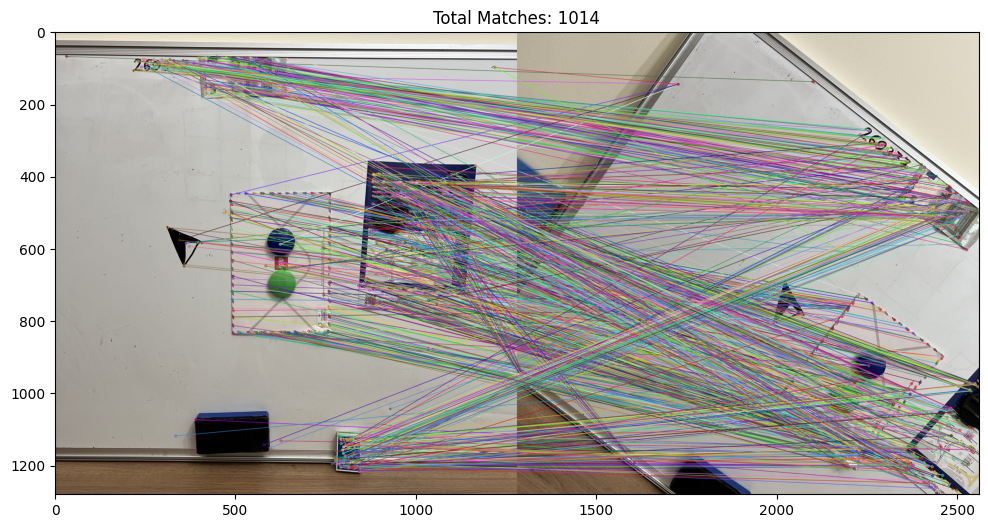

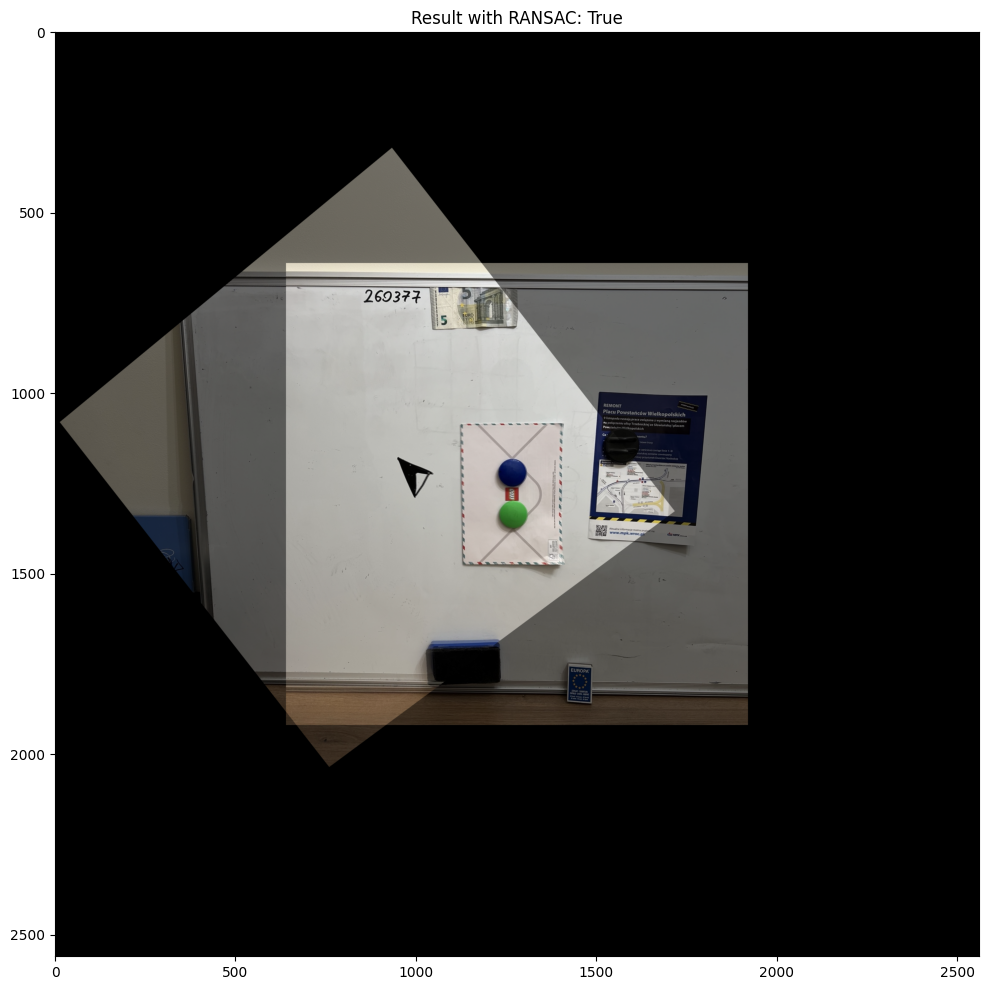

In [76]:
process_images(base, offset_2, 0.1, 0.15, use_ransac=True)

# V2

In [78]:
from PIL import Image

# Load HEIC file and convert to JPEG

# Load the converted image using OpenCV
base = cv2.imread("./assets/v2/base.jpeg")
offset_0 = cv2.imread("./assets/v2/offset_0.jpeg")
offset_1 = cv2.imread("./assets/v2/offset_1.jpeg")
offset_2 = cv2.imread("./assets/v2/offset_2.jpeg")
offset_3 = cv2.imread("./assets/v2/offset_3.jpeg")
# offset_4 = cv2.imread('./assets/offset_4.jpeg')

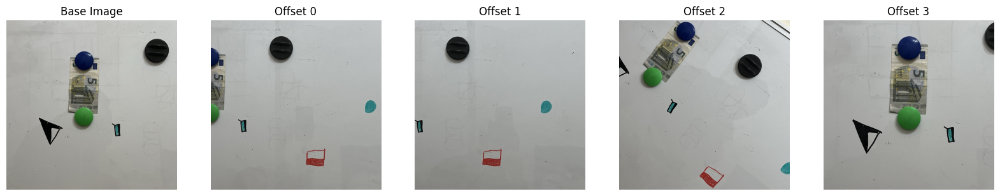

In [79]:
fig, axes = plt.subplots(1, 5, figsize=(20, 20))

axes[0].imshow(cv2.cvtColor(base, cv2.COLOR_BGR2RGB))
axes[0].set_title('Base Image')
axes[0].axis('off')

axes[1].imshow(cv2.cvtColor(offset_0, cv2.COLOR_BGR2RGB))
axes[1].set_title('Offset 0')
axes[1].axis('off')

axes[2].imshow(cv2.cvtColor(offset_1, cv2.COLOR_BGR2RGB))
axes[2].set_title('Offset 1')
axes[2].axis('off')

axes[3].imshow(cv2.cvtColor(offset_2, cv2.COLOR_BGR2RGB))
axes[3].set_title('Offset 2')
axes[3].axis('off')

axes[4].imshow(cv2.cvtColor(offset_3, cv2.COLOR_BGR2RGB))
axes[4].set_title('Offset 3')
axes[4].axis('off')

plt.show()

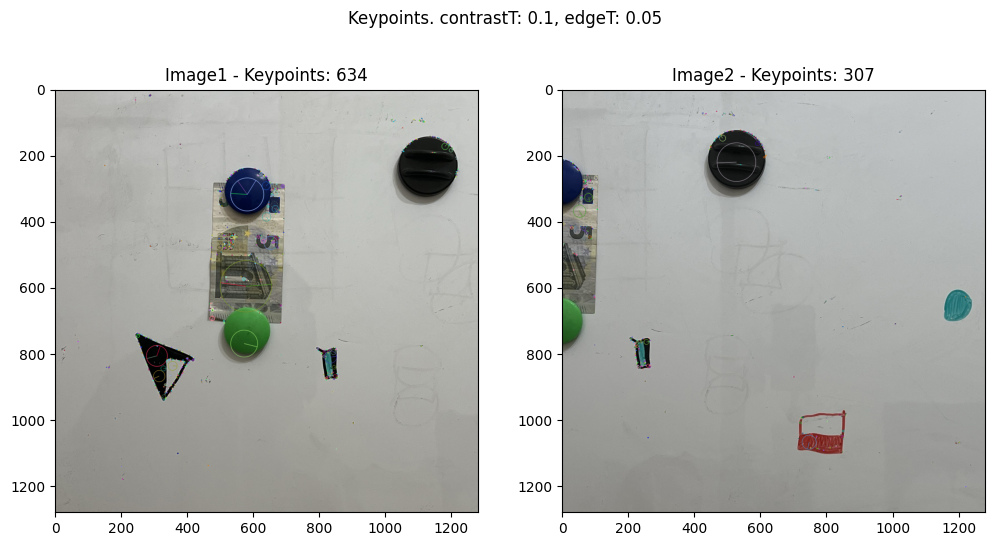

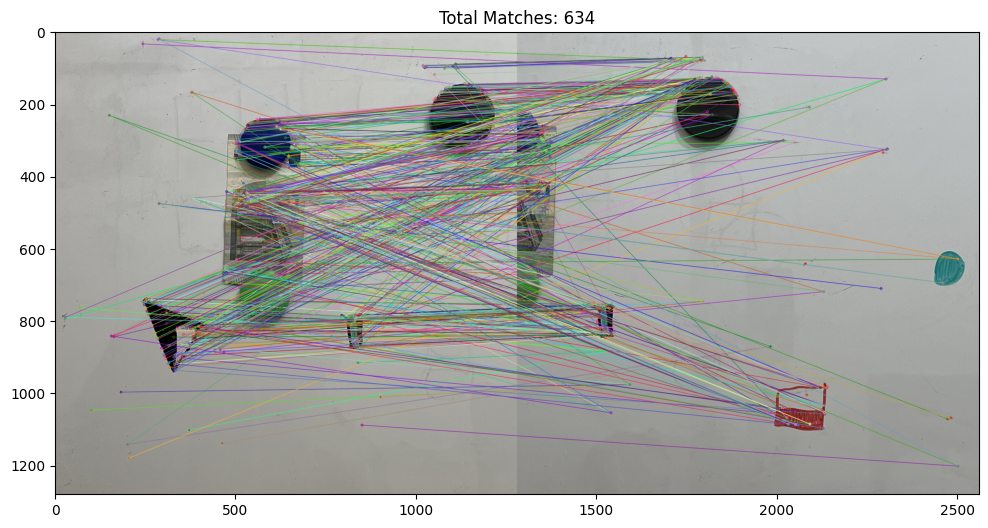

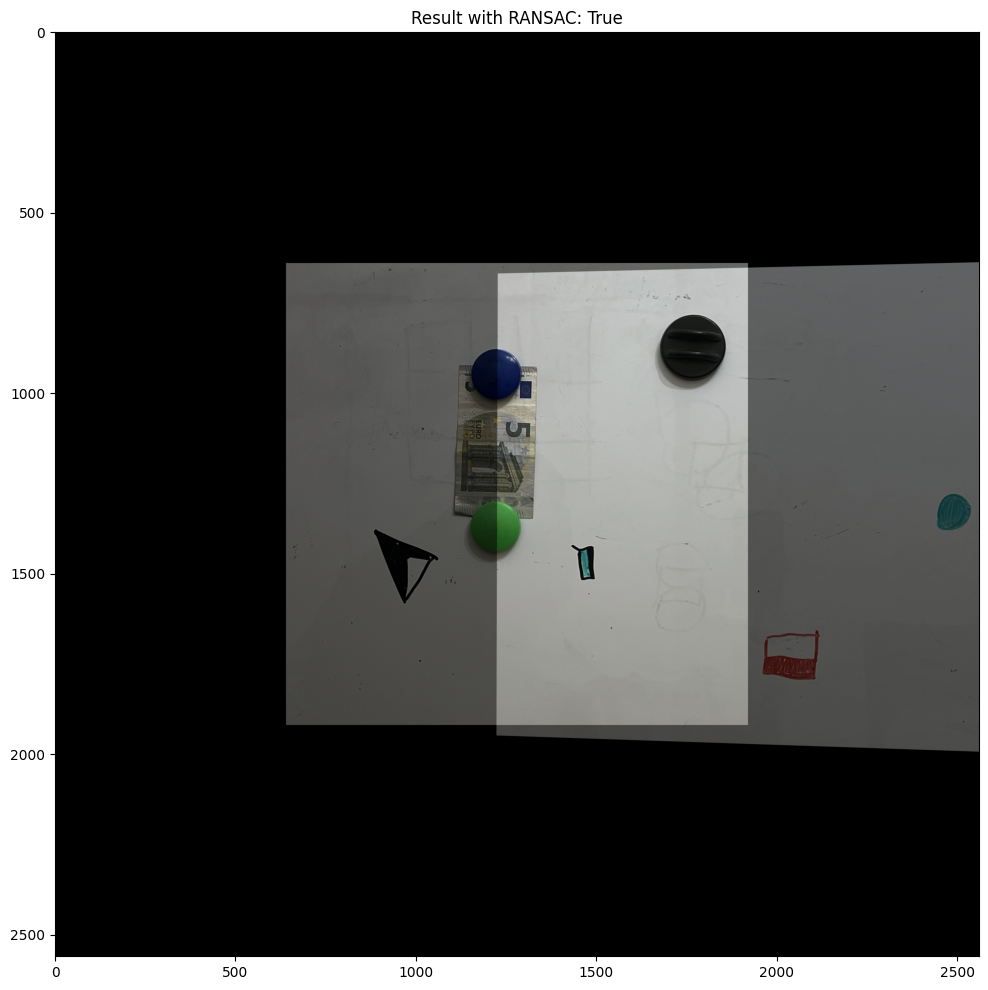

In [64]:
process_images(base, offset_0, 0.1, 0.05, use_ransac=True)

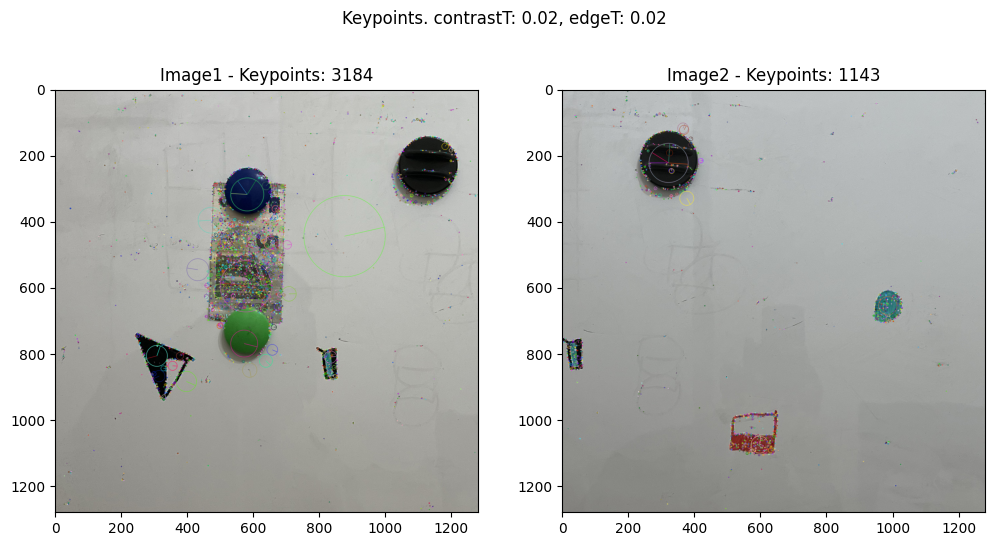

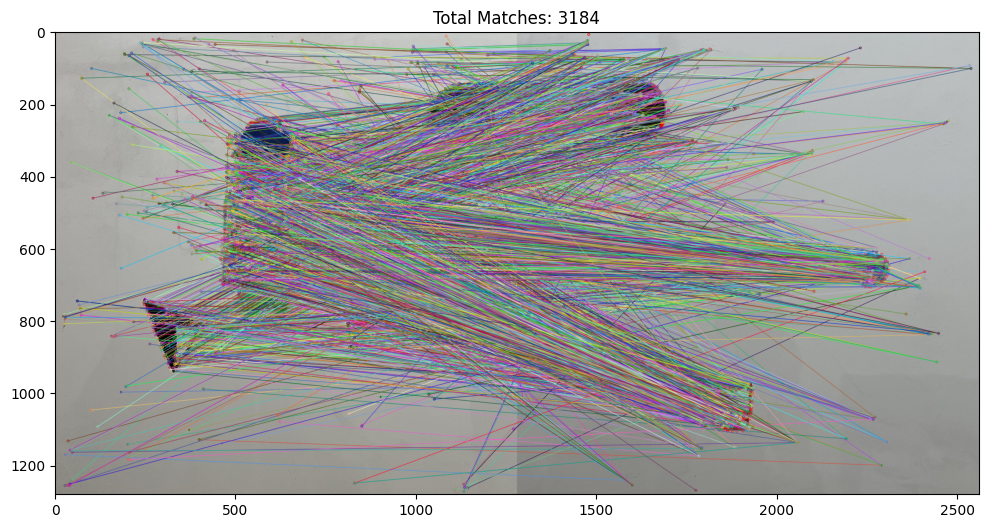

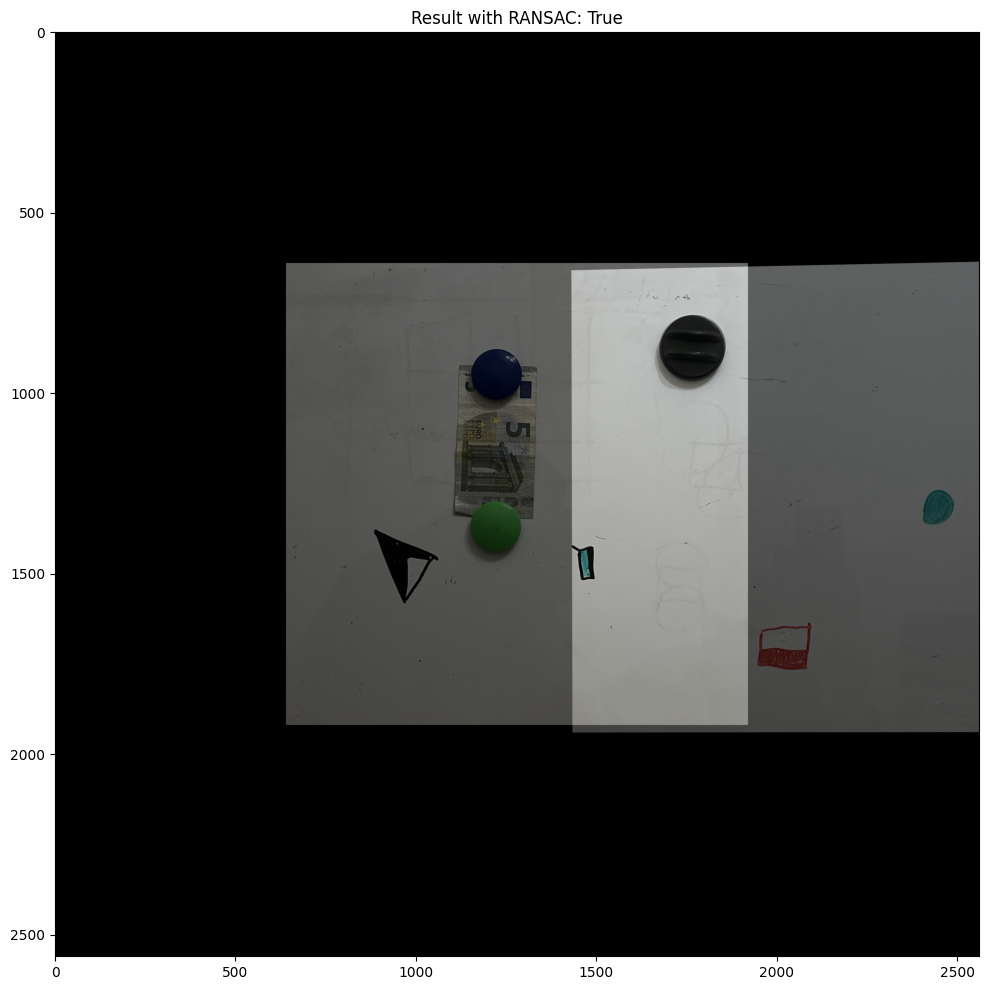

In [61]:
process_images(base, offset_1, 0.02, 0.02, use_ransac=True)

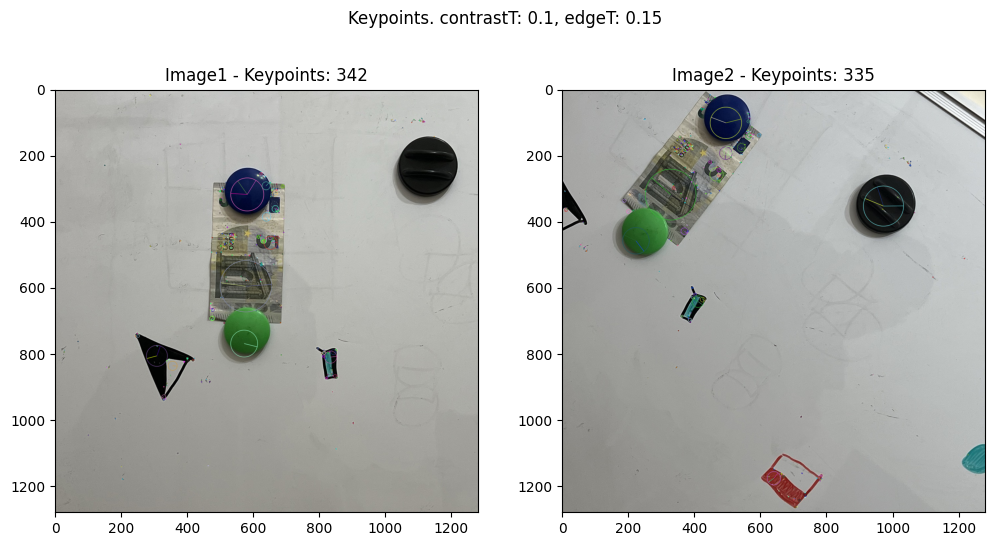

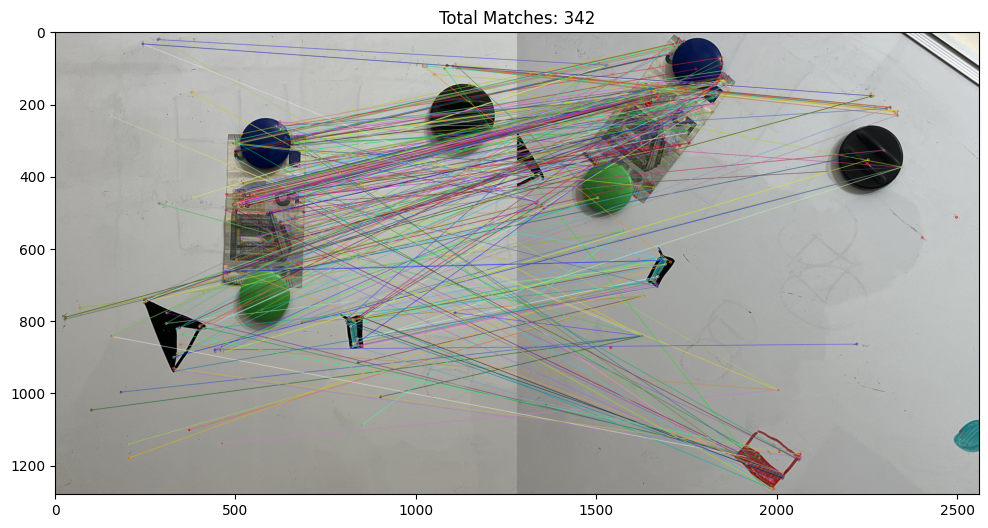

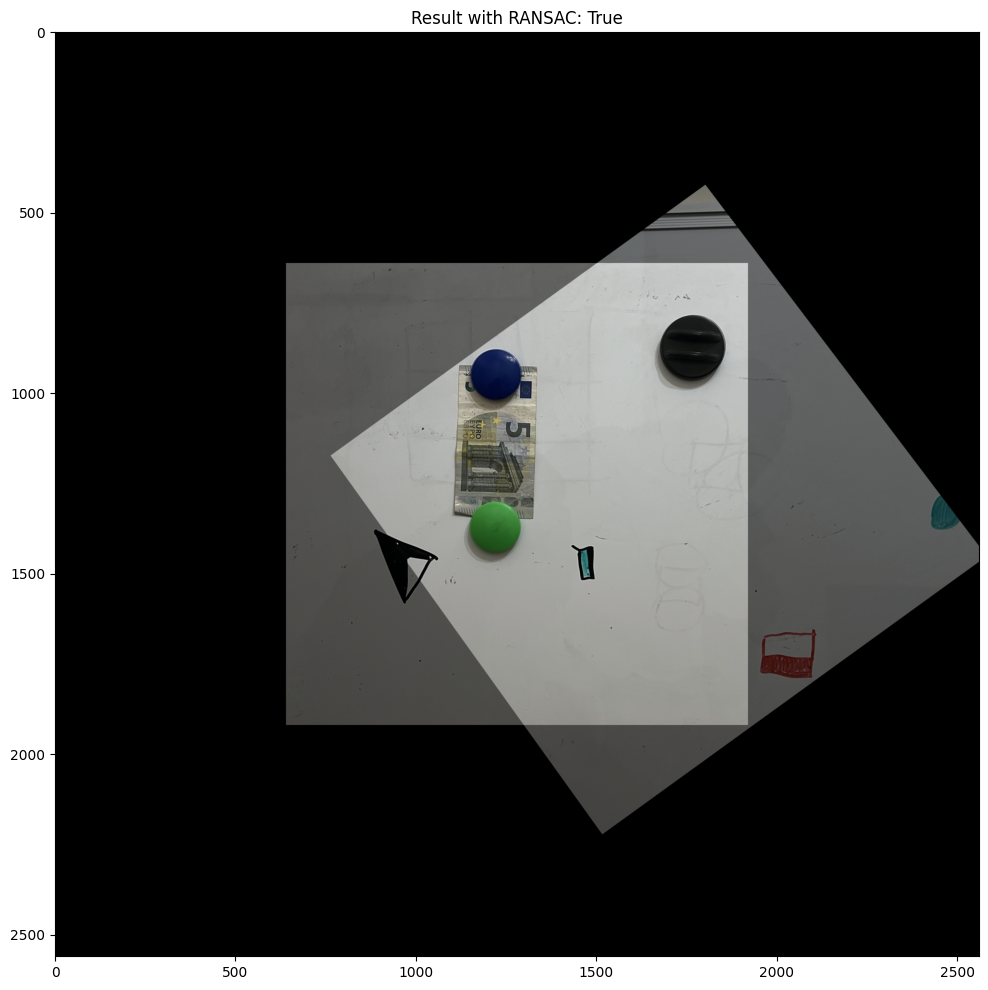

In [58]:
process_images(base, offset_2, 0.1, 0.15, use_ransac=True)

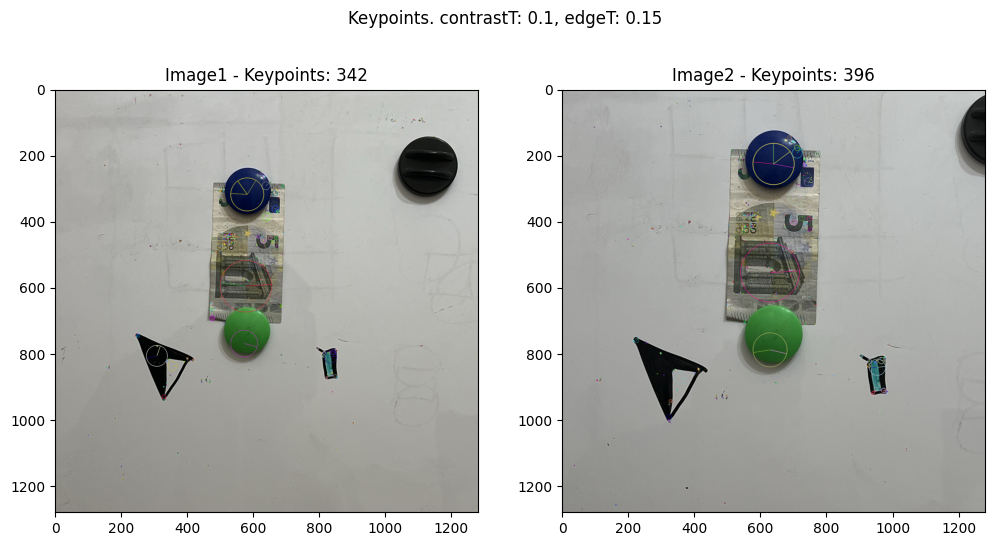

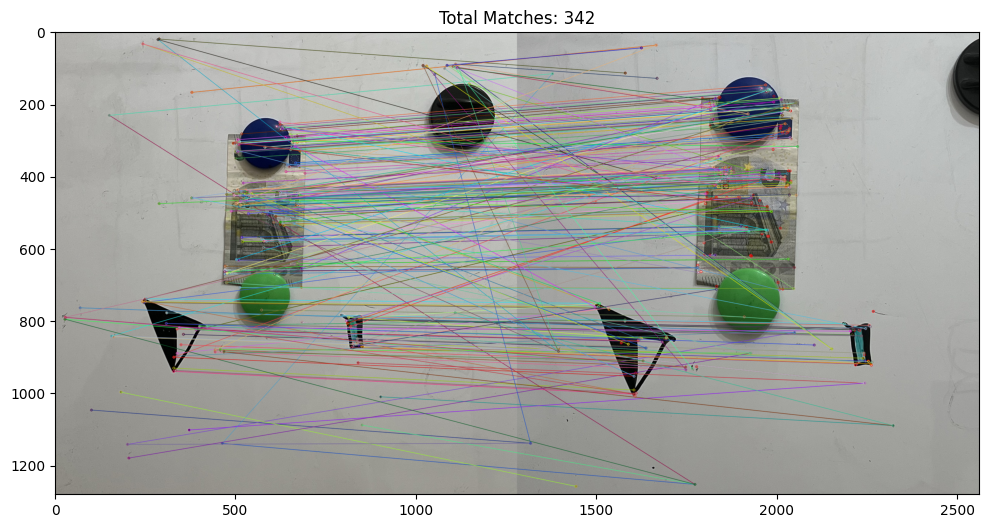

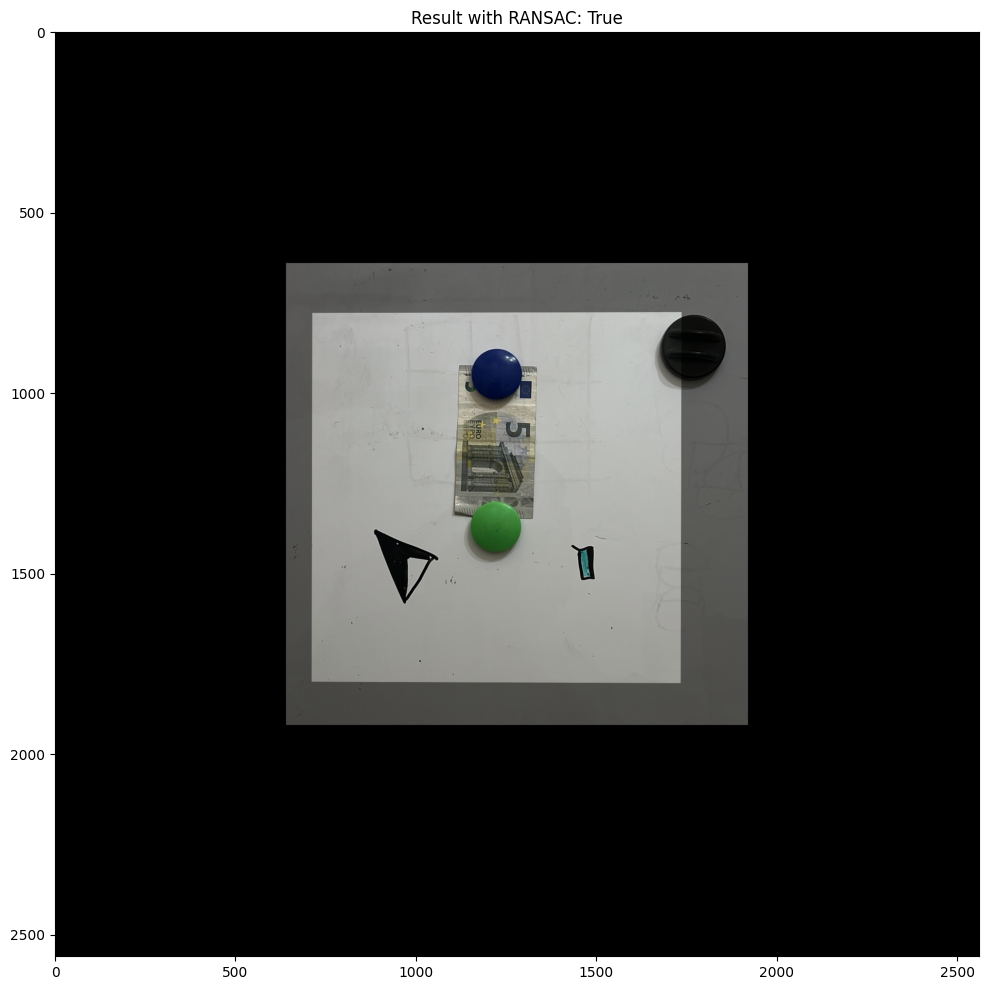

In [59]:
process_images(base, offset_3, 0.1, 0.15, use_ransac=True)